Part 1 – Let there be Color  

(1) At the beginning of the semester, we filled matrices with zeros and ones to make black and
white images. This part of the lab is about making red, blue, and green versions of those images,
retaining the white background. An RGB image is a multi-dimensional array of size rows by
columns by 3 of type ‘uint8’ (i.e. one matrix for red, one for green, one for blue, and all three
concatenated). Test the following command in the Jupyter notebook:

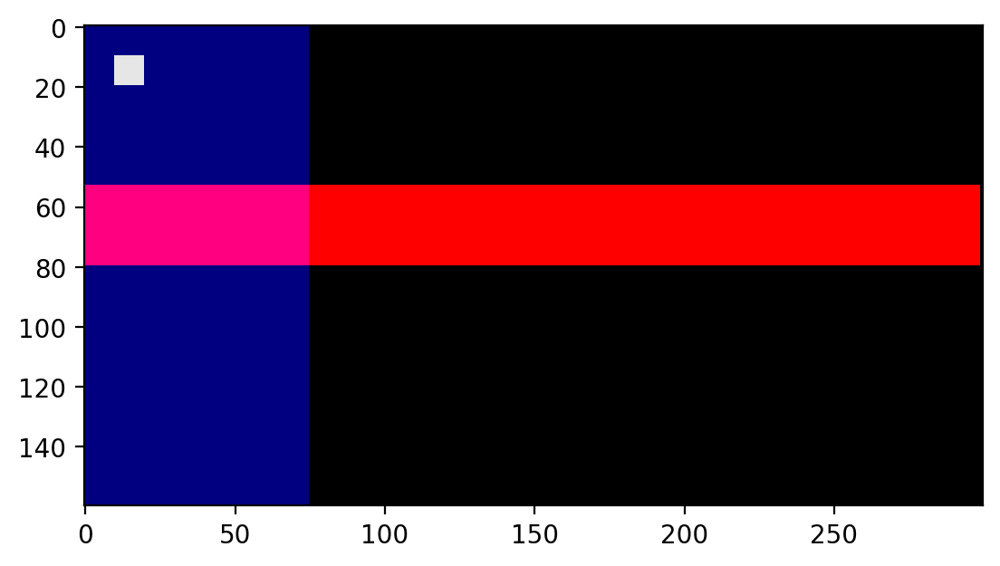

In [159]:
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
import numpy as np
from skimage import io
maxX = 300
maxY = 160
A = np.zeros([maxY,maxX,3],dtype='uint8')
A[maxY//3:maxY//2 , 0:maxX-1, 0] = 255
A[0:maxY , 0:maxX//4,2] = 128
A[ 10:20, 10:20,:] = 230
plt.imshow(A)
plt.show()
io.imsave('almost_a_flag.jpg',A)

The brightness levels will range from 0 to 255, implying that a white color image has all three
matrices filled with 255’s. Also note that to make a red line on a white background; you will need
the blue and green pixels corresponding to that line to have a value of zero. For example, to make
a red image you could start with a white image and set to zero all the blue and green pixels where
your original matrix had a value of 1.

(2) Generate 3 images with, each with a white background with a red, green and blue ‘X’ across
the diagonal. To initialize an array to a white image use:

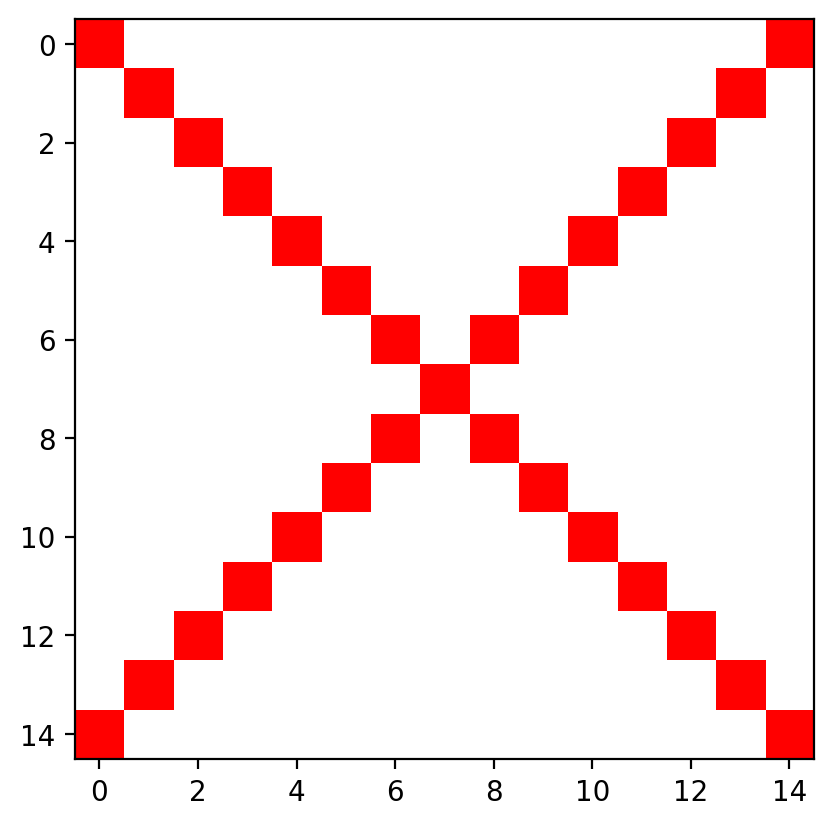

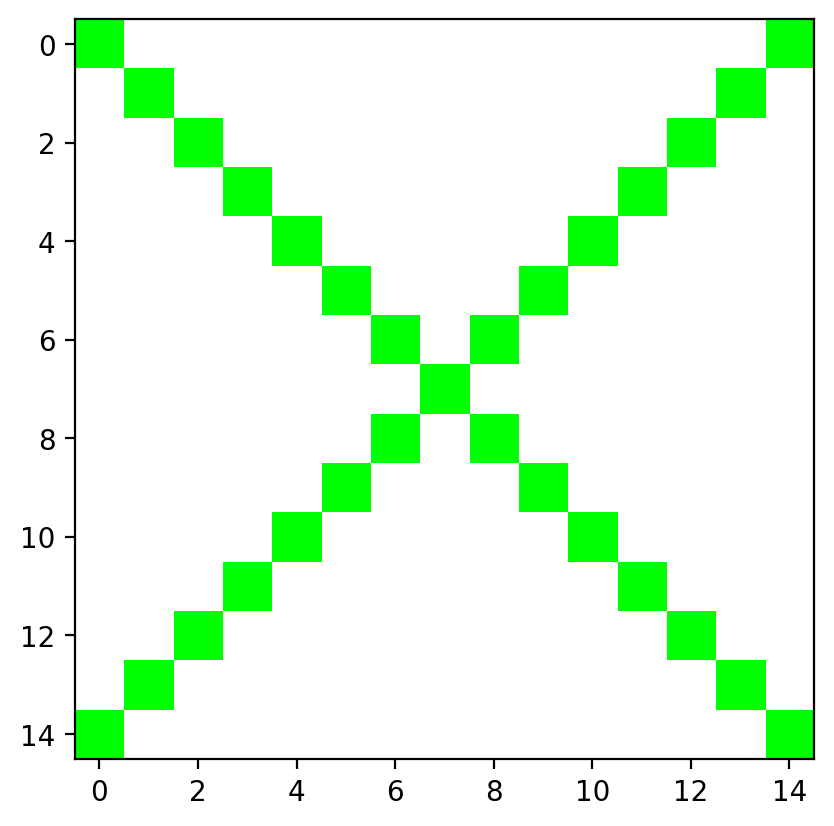

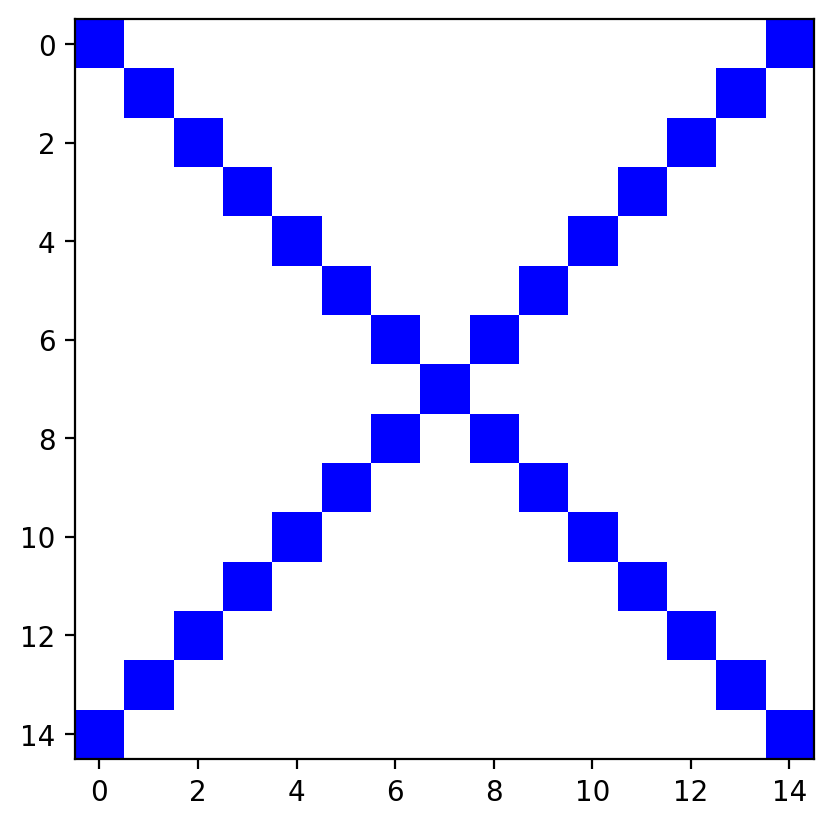

In [160]:
import numpy as np
import matplotlib.pyplot as plt

# Initialize white image
maxX = 15
maxY = 15
A = 255 * np.ones([maxY, maxX, 3], dtype='uint8')

# Add red 'X'
for i in range(maxX):
    A[i, i] = [255, 0, 0]
    A[i, maxX - i - 1] = [255, 0, 0]

# Display red 'X'
plt.imshow(A)
plt.show()
io.imsave('redX.jpg',A)

# Add green 'X'
for i in range(maxX):
    A[i, i] = [0, 255, 0]
    A[i, maxX - i - 1] = [0, 255, 0]

# Display green 'X'
plt.imshow(A)
plt.show()
io.imsave('greenX.jpg',A)

# Add blue 'X'
for i in range(maxX):
    A[i, i] = [0, 0, 255]
    A[i, maxX - i - 1] = [0, 0, 255]

# Display blue 'X'
plt.imshow(A)
plt.show()
io.imsave('blueX.jpg',A)

Part 2 – Bubbles in Pumice

In this part we are using Scikit-image to identify and label regions of a black and white image,
and then to quantify properties of these labeled regions. We provide with two images file 2.jpg
that show dark bubbles in pumice.

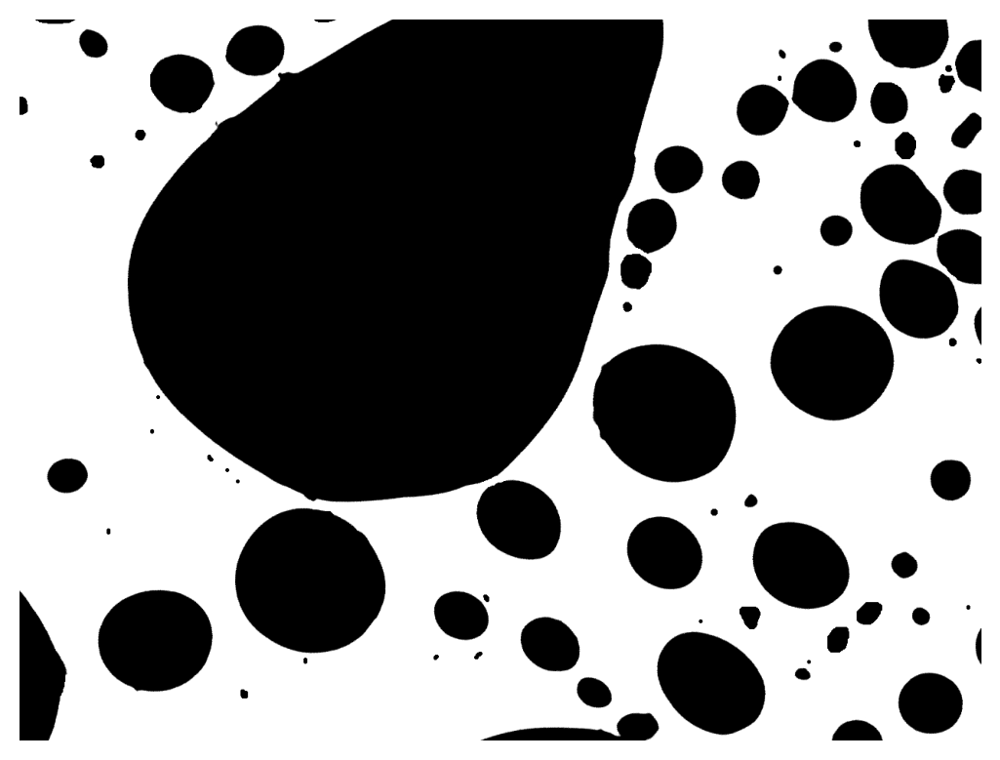

In [161]:
image = io.imread('2.jpg')
plt.axis('off') # turn off axis labels
plt.imshow(image,cmap='gray')
plt.show()

In [162]:
def PrintArrayInfo(a):
    print("Array info:")
    print("shape:", a.shape)
    print("dtype:", a.dtype)
    print("min, max:", a.min(), a.max())
    print()

PrintArrayInfo(image)

Array info:
shape: (960, 1280)
dtype: uint8
min, max: 0 255



If we remove cmap='gray' from the imshow() function call for a black & white or grayscale image, then the image may be displayed using the default color map, which is typically a colormap that uses a range of colors to represent the intensities in the image. This could lead to the image appearing with incorrect or unexpected colors, which can make it harder to interpret or analyze the data being represented.

(2) Take a look at the histogram to see the distribution of intensities.

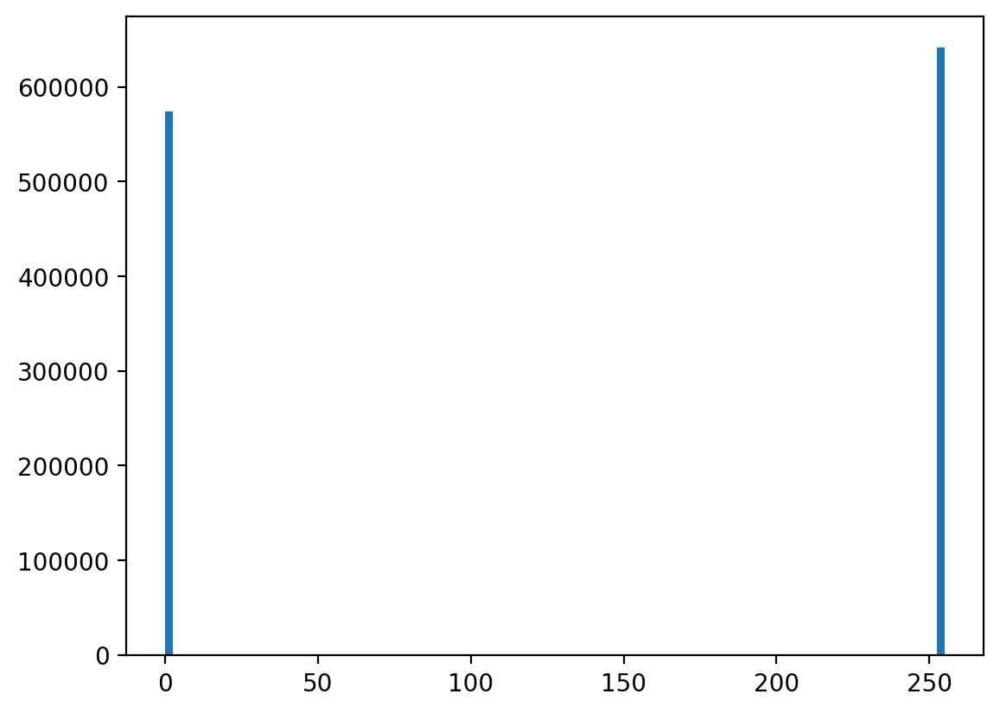

In [163]:
plt.hist(image.ravel(),100)
plt.show()

(3) Apply an intensity treshhold ‘val’ to convert the grayscale image to a black-and-white image:

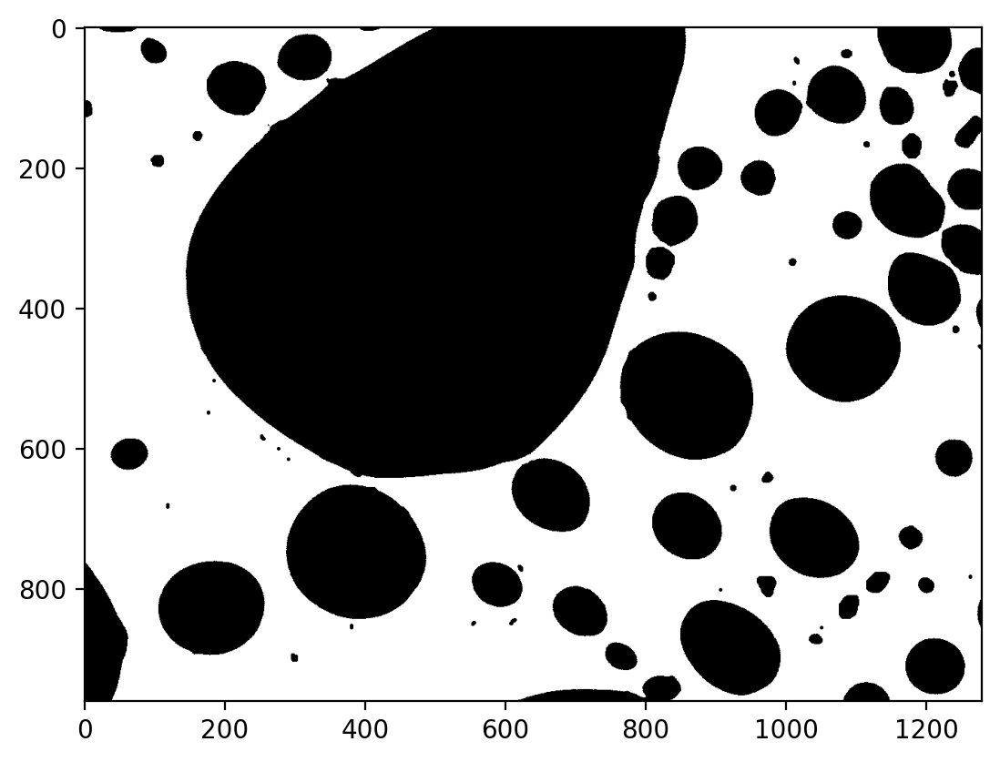

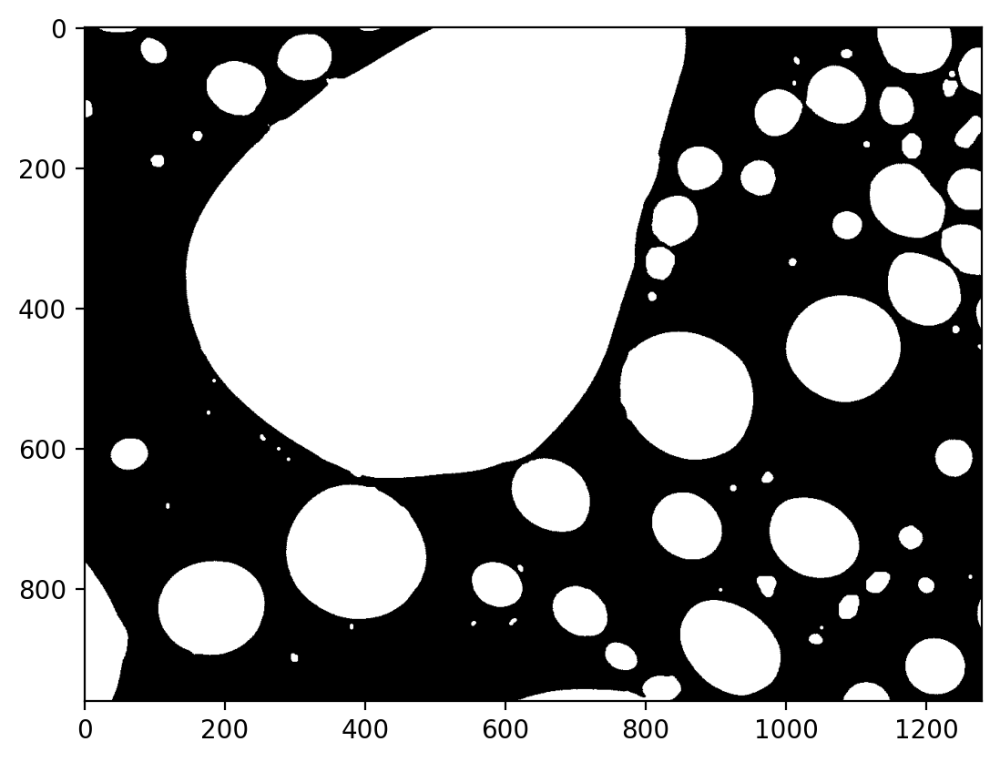

Array info:
shape: (960, 1280)
dtype: bool
min, max: False True

Array info:
shape: (960, 1280)
dtype: bool
min, max: False True



In [164]:
val = 50
image_bw1 = (image > val)
image_bw2 = (image <= val)

plt.imshow(image_bw1,cmap='gray')
plt.show()

plt.imshow(image_bw2,cmap='gray')
plt.show()

PrintArrayInfo(image_bw1)
PrintArrayInfo(image_bw2)

(4) Now we want to eliminate all tiny speckles that probably are just noise. Apply all four morphological
operator erosion(), dilation(), opening() and closing() to both black-and-white images
in order to identify the best one to eliminate the small grains from the image without changing the size of
the larger bubbles.
All of these operations require a geometric element to define a neighborhood of an pixel within the image.
Here we selected circle or disk:

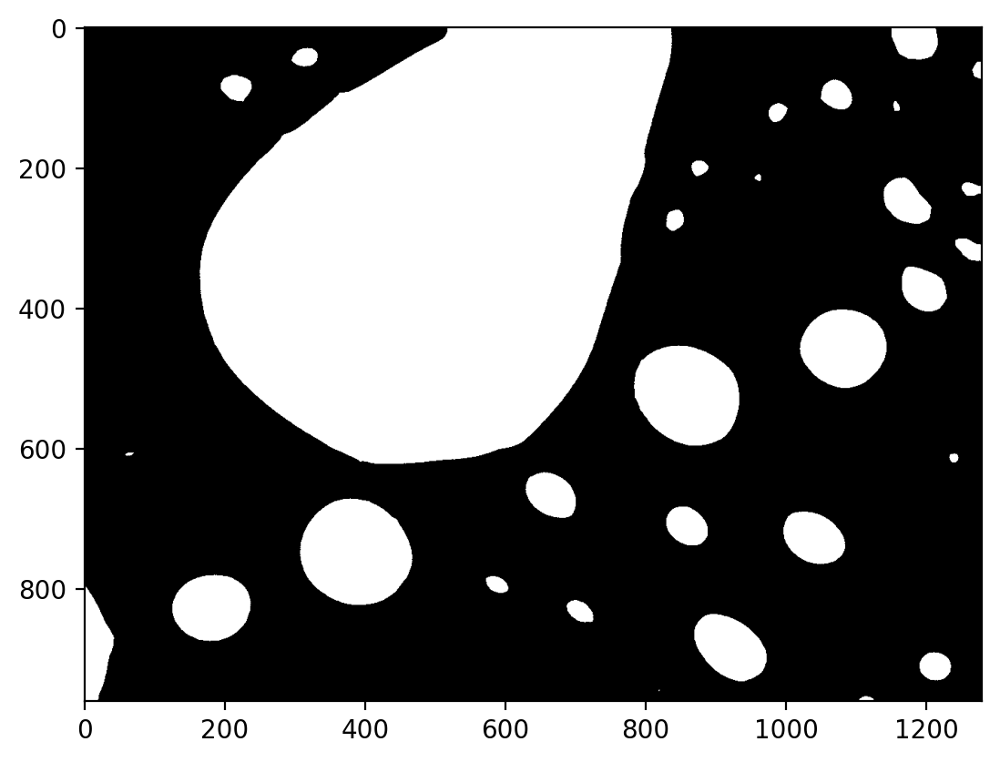

In [165]:
from skimage.morphology import disk, erosion, dilation, opening, closing
selector = disk(20)
image_morph1 = erosion(image_bw1, selector)
image_morph2 = erosion(image_bw2, selector)
plt.imshow(image_morph1,cmap='gray')
plt.imshow(image_morph2,cmap='gray')
plt.show()

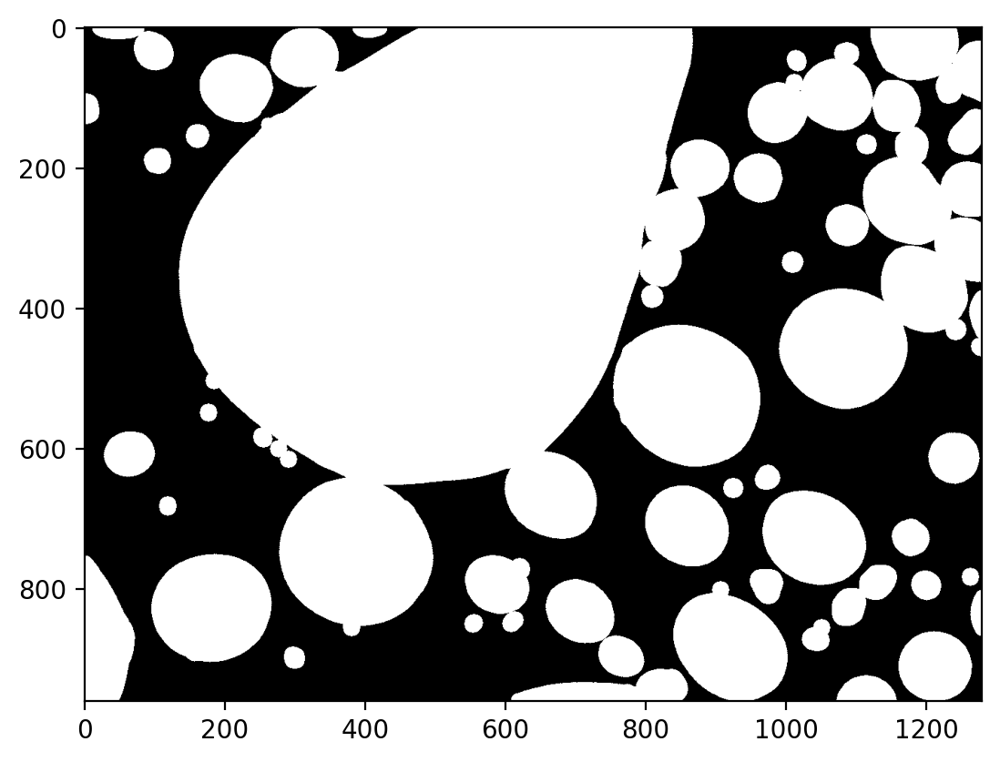

In [166]:
selector = disk(10)
image_morph1 = dilation(image_bw1, selector)
image_morph2 = dilation(image_bw2, selector)
plt.imshow(image_morph1,cmap='gray')
plt.imshow(image_morph2,cmap='gray')
plt.show()

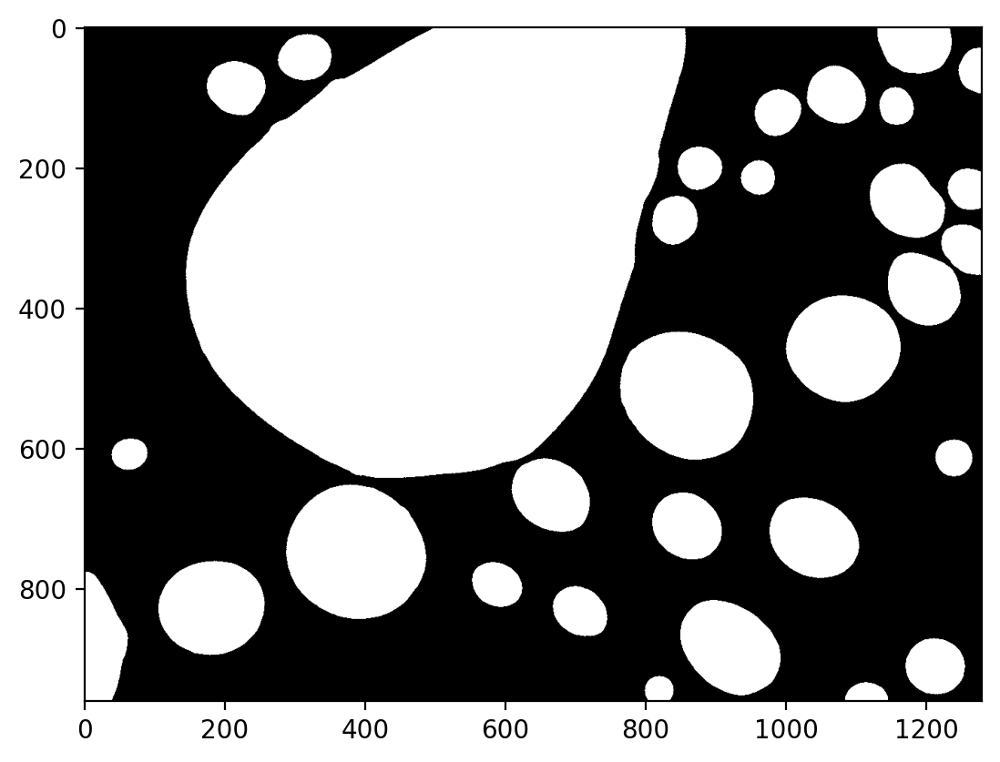

In [167]:
selector = disk(20)
image_morph1 = opening(image_bw1, selector)
image_morph2 = opening(image_bw2, selector)
plt.imshow(image_morph1,cmap='gray')
plt.imshow(image_morph2,cmap='gray')
plt.show()

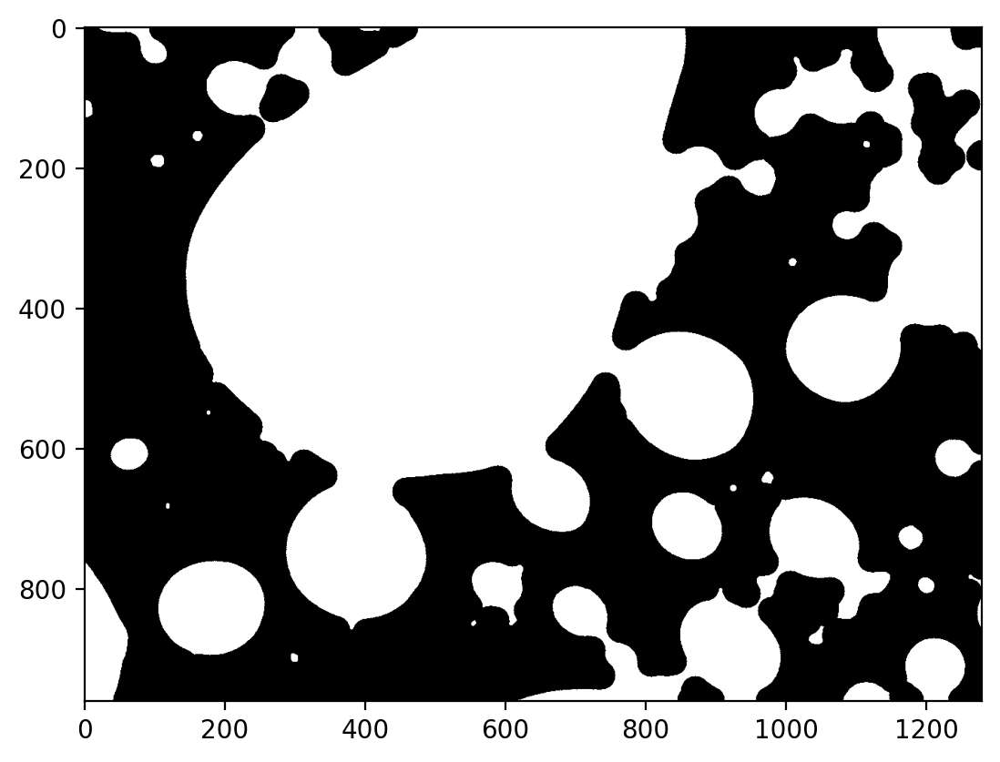

In [168]:
selector = disk(20)
image_morph1 = closing(image_bw1, selector)
image_morph2 = closing(image_bw2, selector)
plt.imshow(image_morph1,cmap='gray')
plt.imshow(image_morph2,cmap='gray')
plt.show()

The erosion is the best in this situation

(5) Now we can use Scikit function measure.label() to label to give every bubble a different
number (or label).

In [169]:
from skimage import measure
selector = disk(15)
image_morph_best = erosion(image_bw2, selector)
labels = measure.label(image_morph_best)
print(np.unique(labels))
PrintArrayInfo(labels)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]
Array info:
shape: (960, 1280)
dtype: int32
min, max: 0 39



Using the array labels, count the number of bubbles in the image. Note the background is given label
‘0’. There is also a simple way to display the bubbles in different colors:

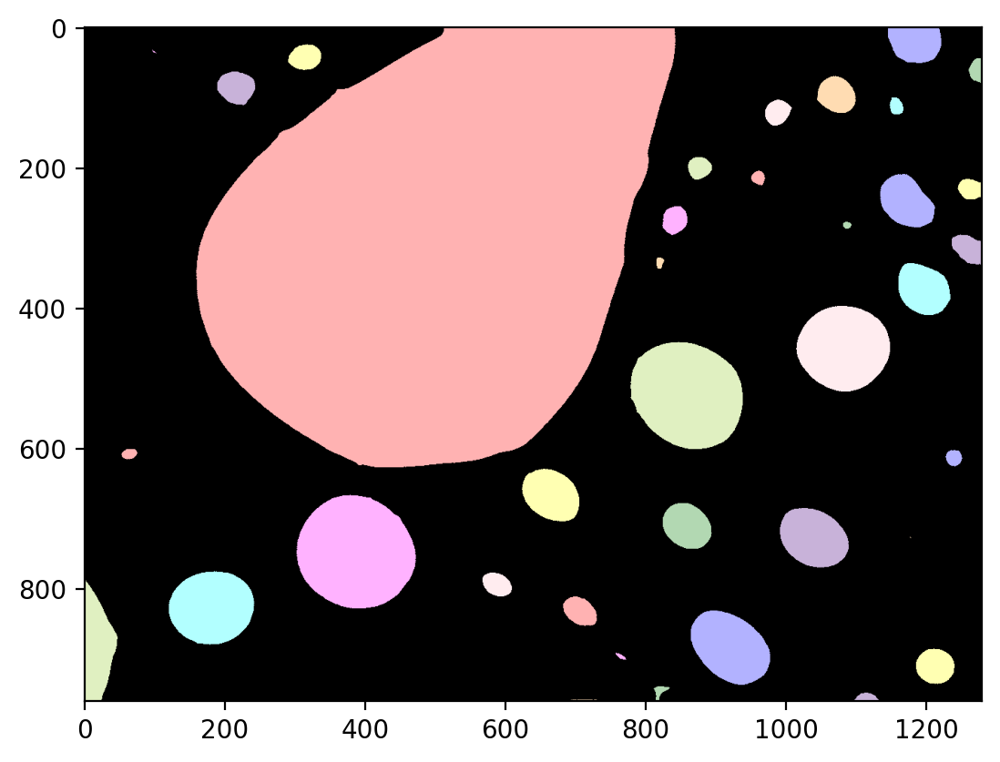

In [170]:
from skimage.color import label2rgb
image_label_overlay = label2rgb(labels, image=image_morph_best)
plt.imshow(image_label_overlay)
plt.show()

(6) Now use the Scikit-image function measure.regionprops() to generate a list of
properties for every region. Select and display the 10th bubble with

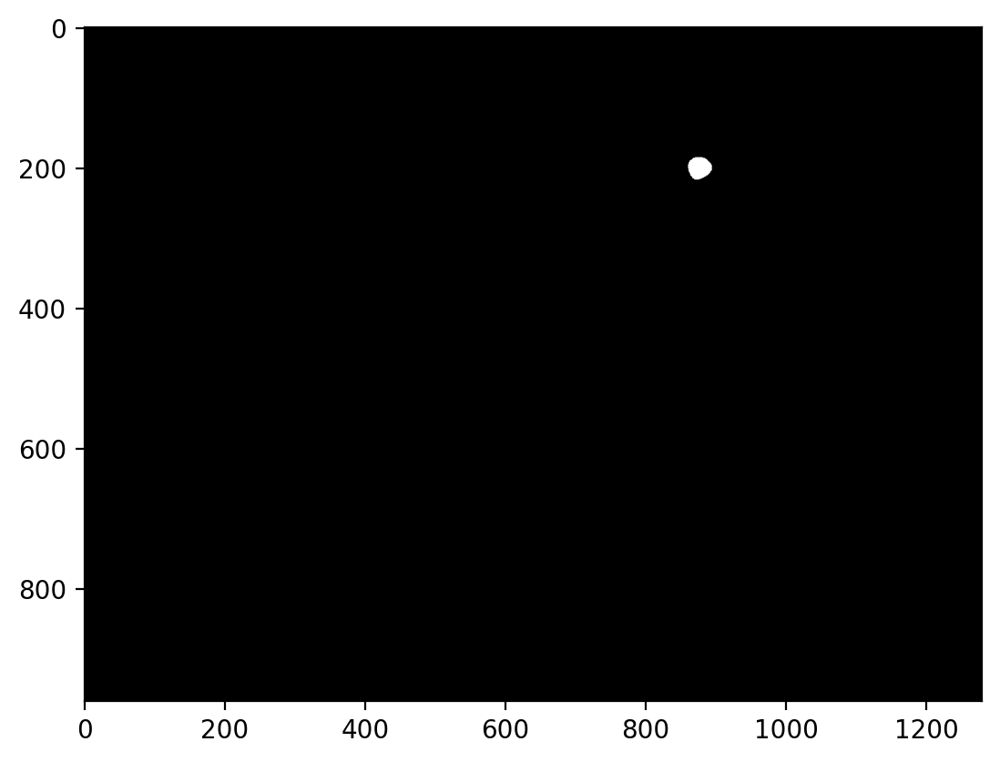

In [171]:
props = measure.regionprops(labels)
# select the 10th region
bubble = props[9]
# get the coordinates of the bubble
x1, y1, x2, y2 = bubble.bbox
# Make a new image with the dimensions of the original one
img = np.zeros(image_morph_best.shape,dtype=bool)
# place the bubble image in the correct location in the new image
img[x1:x2,y1:y2] = bubble.image
plt.imshow(img,cmap='gray')
plt.show()

RegionProps gives us access to a long list of properties that you can view here. Included in this
list are image, which returns an array of pixels for the selected region, and the bounding box
bbox, which defines the location of bubble with the original image. Above we have provided code
for generating an image that shows just the selected bubble.

(7) props also includes also area that provides a bubble’s size in pixels. Starting from the
following loop, generate an image that shows just the second largest bubble. This will require some
coding,

In [172]:
for p in props:
    print(p.area)

310616
3286
1325
9
551
1948
2186
373
1021
838
300
4230
836
1115
94
1407
136
4238
12531
19068
257
420
4656
21153
3494
6347
2
9962
1080
5389
1480
8622
2167
69
220
303
103
1
1


Part 3 – LANDSAT imagery

LANDSAT is a satellite imagery program co-managed by the USGS and NASA that has been
continuously monitoring the Earth’s surface since 1972. Here we will look at photographs of the
Bay Area taken by the most recent satellite, LANDSAT 8.
LANDSAT 8 has instruments for sensing in 11 different bands, each corresponding to a different
range of the electromagnetic spectrum.


(1) First, we will look at the single red band image. Read in the correct image using scikitimages
and then display the grayscale image of intensities.

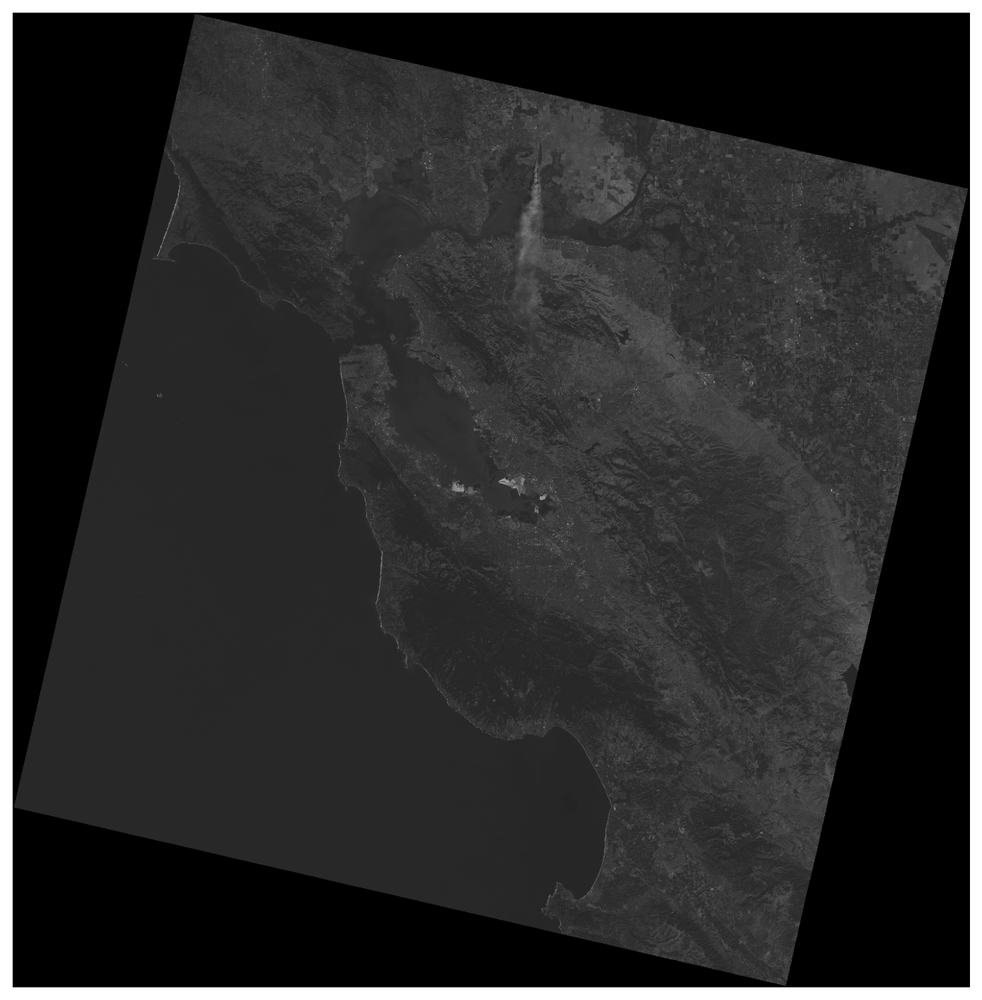

In [173]:
# load in the band
ls_red = io.imread('landsat_band'+str(4)+'.tif')
# plot the band using matplotlib
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plt.axis('off')
plt.imshow(ls_red,cmap='gray')
plt.show()

(2) The TIF image stores the raw data captured by LANDSAT. Use the look out how the
data is stored (what datatype). Use the PrintArrayInfo() function we defined earlier to
look at how the data is stored. What is the datatype? What are the maximum and
minimum values of the raw data?
The LANDSAT data is stored as a ‘uint16’, instead of ‘uint8’, as they are meant to
represent the precision of intensities as measured by the LANDSAT8 instruments, rather
than being normalized to represent a meaningful color image.

(3) For the purposes of image manipulation, it is recommended to convert to ‘float64’, so as
to avoid any loss of precision. Scikit-image provides the following command for
converting an image array to the desired datatype img_as_ubyte() (uint8),
img_as_uint() (uint16), and img_as_float64() (float64). Convert the image to a
float64 array, and look at how the format has changed.

In [174]:
from skimage import img_as_ubyte, img_as_uint, img_as_float64
ls_red = img_as_float64(ls_red)
PrintArrayInfo(ls_red)

Array info:
shape: (1500, 1473)
dtype: float64
min, max: 0.0 0.600350957503624



(4) Now take red band and put it into a RGB image. Start by generating and an array of the
correct dimensions with zero intensities:

In [175]:
nx,ny = ls_red.shape
red_only = np.zeros([nx,ny,3],dtype=np.float64)

and then fill in the part of the array that represents the red channel using the standard
array indexing notation. Display this image using plt.imshow(). It should appear red, but
once again will be very dim.

(5) Now repeat steps (1-4) for green and blue LANDSAT bands to create a color image with
the R, G, and B channels corresponding to the correct bands. Display the image, it should
look like this.

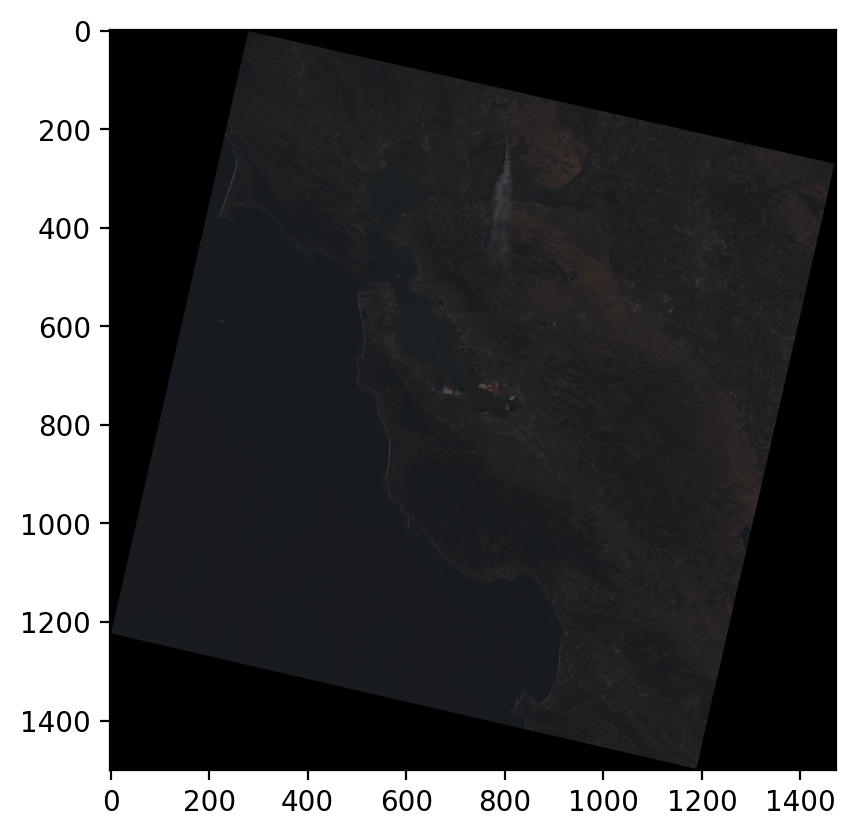

In [176]:
ls_green = io.imread('landsat_band'+str(3)+'.tif')
ls_green = img_as_float64(ls_green)
nx,ny = ls_green.shape
green_only = np.zeros([nx,ny,3],dtype=np.float64)

ls_blue = io.imread('landsat_band'+str(2)+'.tif')
ls_blue = img_as_float64(ls_blue)
nx,ny = ls_blue.shape
blue_only = np.zeros([nx,ny,3],dtype=np.float64)

ls_rgb = np.dstack((ls_red, ls_green, ls_blue))
plt.imshow(ls_rgb)
plt.show()

The resulting color image is very dark with muted colors. Why is this? LANDSAT images
represent the intensity measured by the spacecraft instrument, with the values corresponding to
the sensitivity of the instrument to a range of wavelengths. The next step will be to modify the
image to combine the channels in a way that the human eye would view it.

(6) In the accompanying file image_manipulation.py, we have provided a few functions
to aid with the rescaling of the image (feel free to open the file if you wish to see what
they do). First import and use the provided function to plot the intensity histogram from
the RGB image.

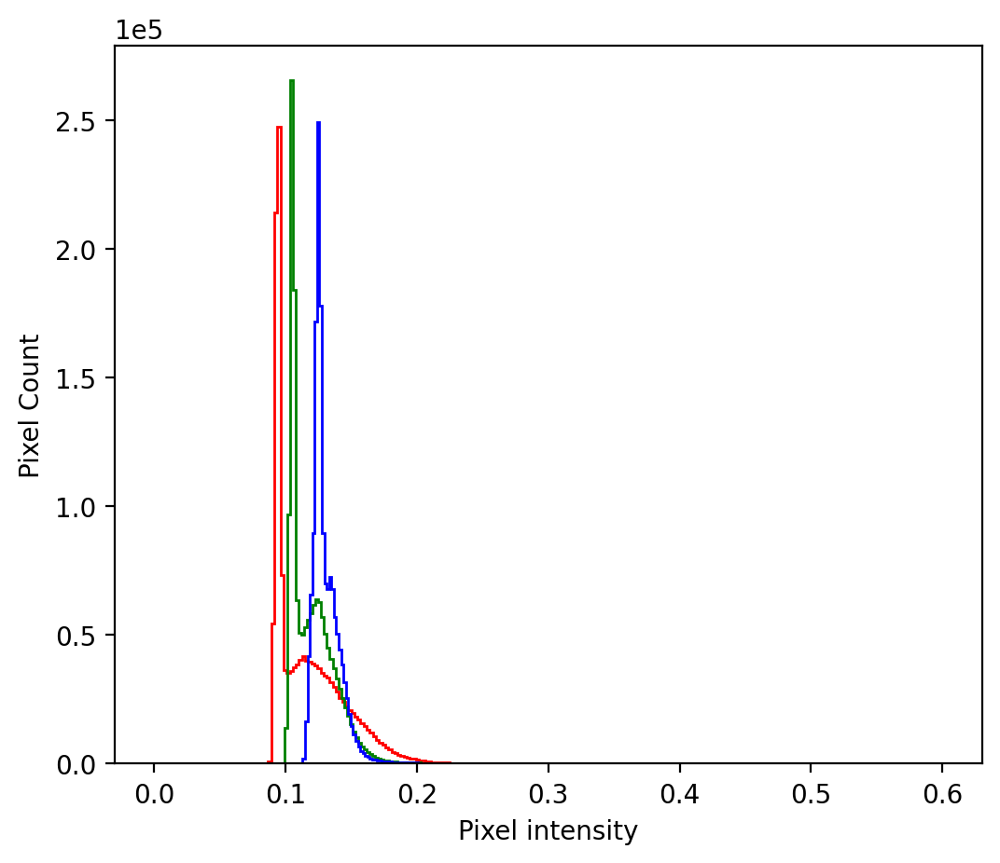

In [177]:
from image_manipulation import plot_channel_intensities
plot_channel_intensities(ls_rgb)
plt.show()

You should see that most of the pixels fall within a narrow range of intensities (the maximum
allowed intensity is 1).

(7) To generate an RGB image more akin to what you would see looking down on earth we
need to stretch the contrast between intensities in each band. This is done by picking a
percentile range over which to apply the stretching (5% and 95% is reasonable, but you
can test the effect of changing this), and then using the following functions.

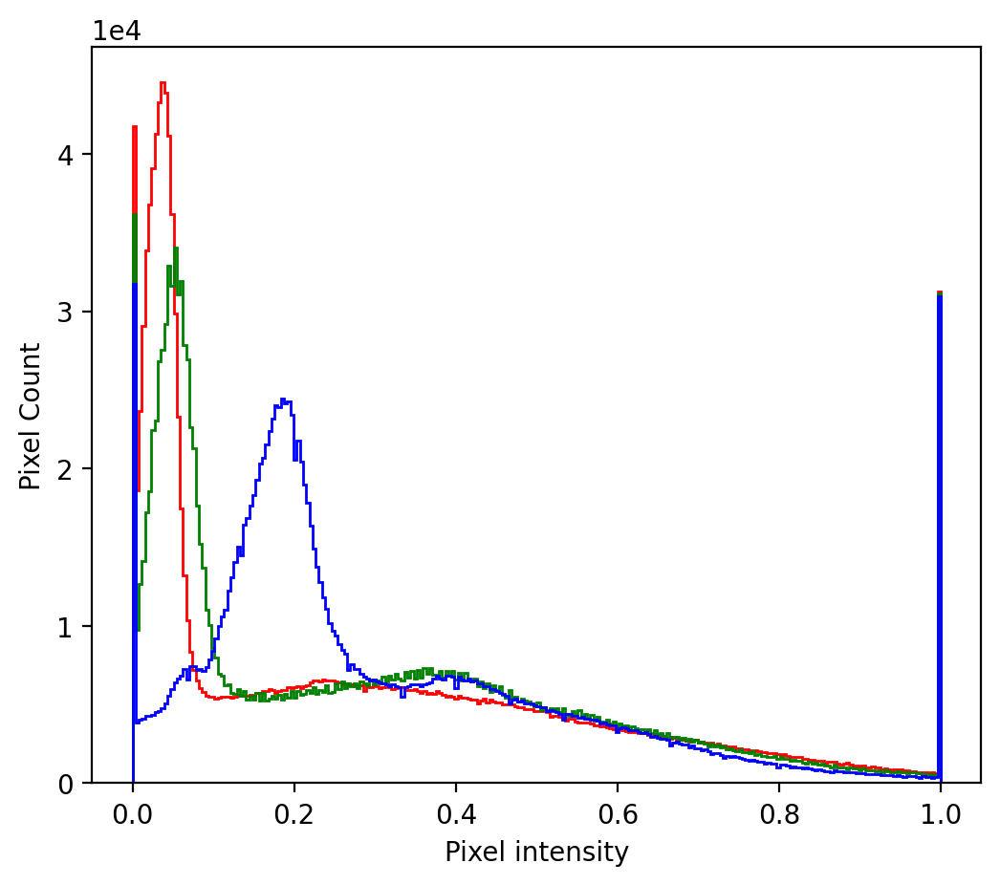

In [178]:
from image_manipulation import rescale_intensities
flow = 5
fhigh = 95
ls_rgb_rescale = rescale_intensities(ls_rgb,flow,fhigh)
plot_channel_intensities(ls_rgb_rescale)
plt.show()

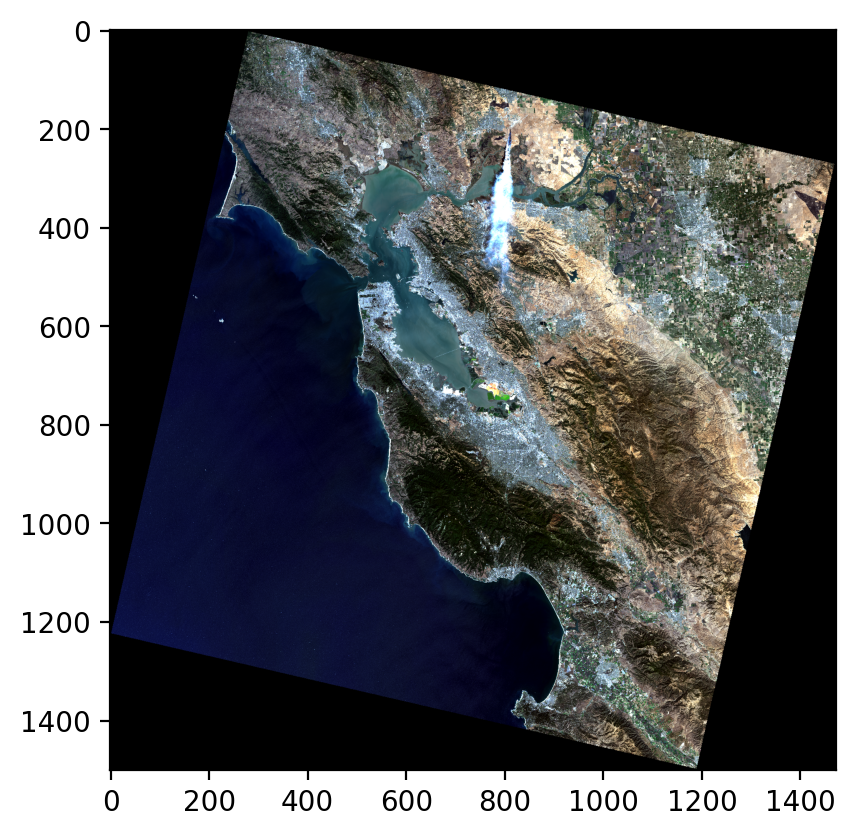

In [179]:
plt.imshow(ls_rgb_rescale)
plt.show()

(8) Lets to a few basic image manipulations to rotate and center the image. First find the correct
angle (in degrees) so that the image is justified with the edges of the image using scikit-image’s
rotate function and displaying the resulting image

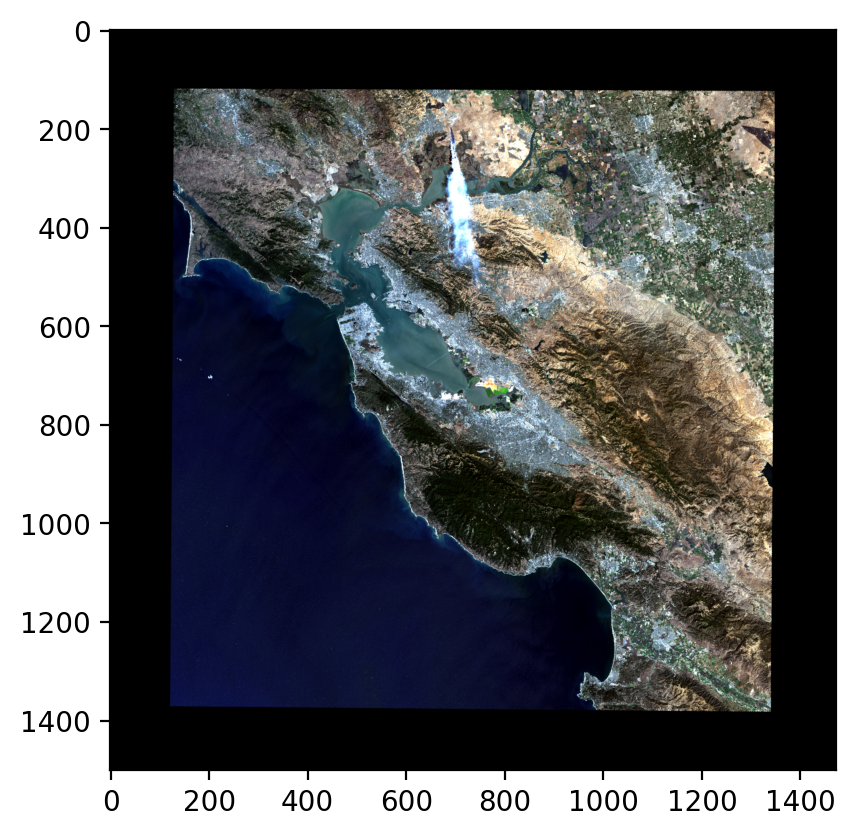

In [180]:
from skimage.transform import rotate
image = ls_rgb_rescale
angle = 12.5
image_rot = rotate(image, angle)
plt.imshow(image_rot)
plt.show()

Now lets crop the image to remove the black edges (where there was no LANDSAT data). This
can be done using array indexing to represent how many pixels from the edges of the photograph
to keep.

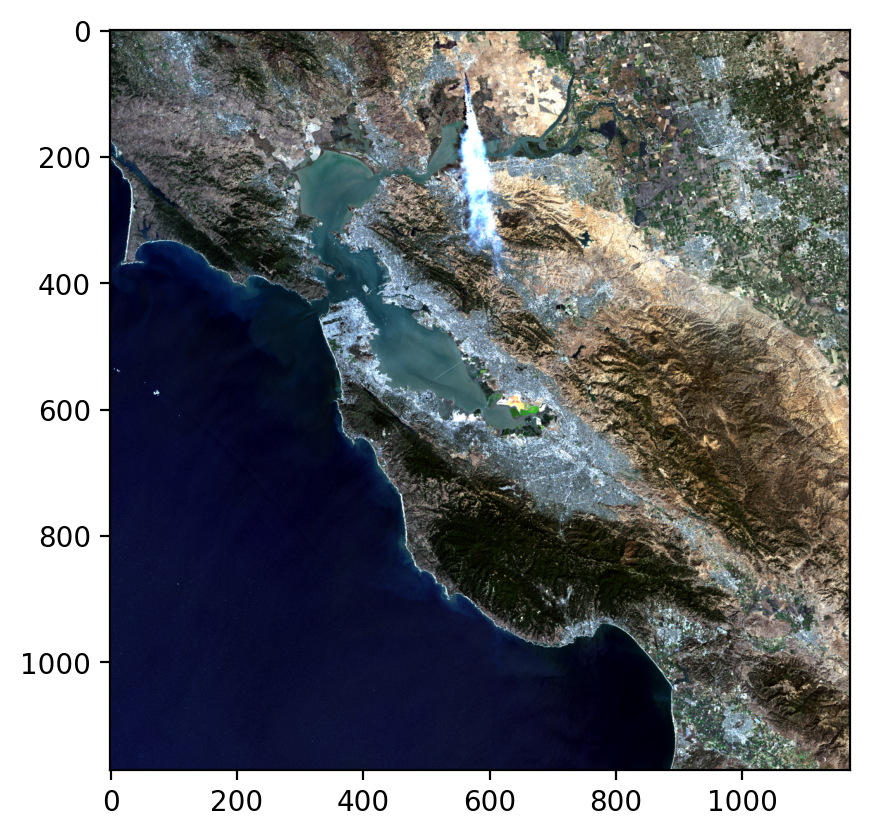

In [181]:
image = image_rot
image_crop = image[130:1300,130:1300]
plt.imshow(image_crop)
plt.show()

(9) Finally export a jpg image entitled ‘bay_area_rgb.jpg’, using Scikit-image io.imsave(). You
must make sure to convert it to ‘uint8’ using the img_as_ubyte() function. Verify that you
have done this correctly by opening it in your operating system image viewer.

In [182]:
io.imsave('bay_area_rbg.jpg',img_as_ubyte(image_crop))

Part 4 – Indexing false color image to measure land usage.

In part 3 you combined the LANDSAT channels to create a RGB image that is similar to how the human
eye would observe the landscape. However, LANDSAT collects images in other wavelengths that can
provide additional information. In order to visualize this information you can combine any combination
of 3 bands into the 3 channels of an RGB image, to creat a “false-color” image.
One commonly used sets of bands in satellite imagery is “Color Infrared”, which is useful for quantifying
the healthy vegetation in an area.

(1) Copy over the necessary code from Part 3 to generate a color image from the LANDSAT bands.
However, this time load the Near-IR, red and green LANDSAT bands (bands 5, 4 and 3) into the
red, green and blue channels, respectively.

In [183]:
bands = [5,4,3]
ls_red = io.imread('landsat_band'+str(bands[0])+'.tif') # red
ls_green = io.imread('landsat_band'+str(bands[1])+'.tif') # green
ls_blue = io.imread('landsat_band'+str(bands[2])+'.tif') # blue

(2) Now create and display the false color image using the manipulations from Part 3. Remember that
you must convert the images to float64, re-scale the intensities to bring out the contrast of the
image, then rotate and crop the black edges. You should see that highly vegetated regions show
up as a bright red, when you display the image. The resulting image should look like this

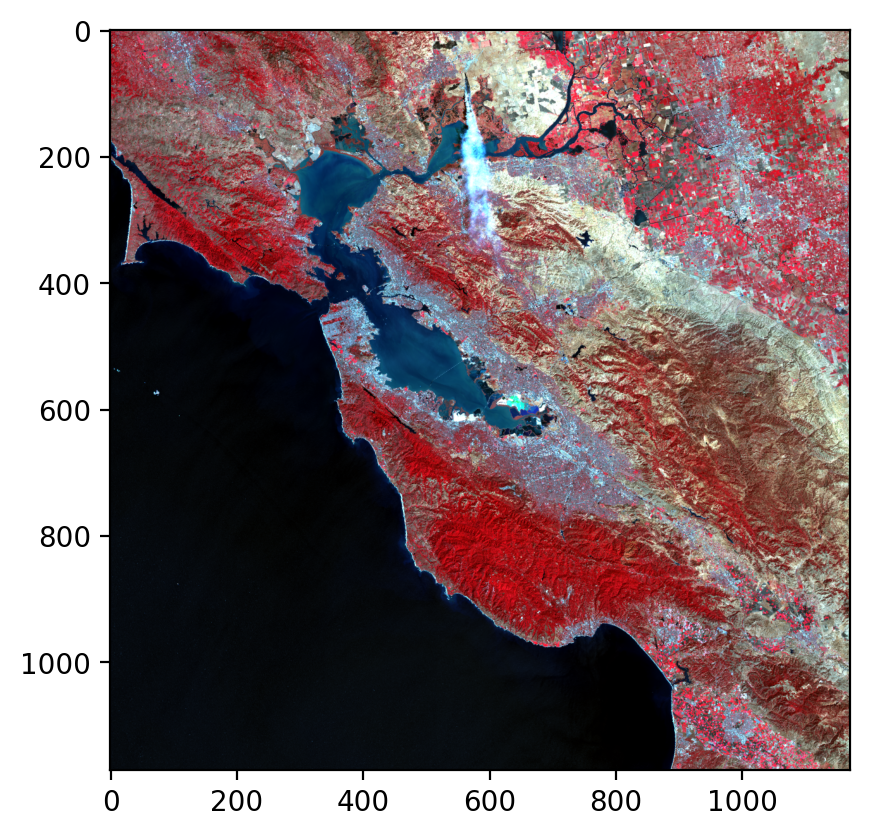

In [184]:
ls_red = img_as_float64(ls_red)
ls_green = img_as_float64(ls_green)
ls_blue = img_as_float64(ls_blue)
ls_rgb = np.dstack((ls_red, ls_green, ls_blue))
flow = 5
fhigh = 95
ls_rgb_rescale = rescale_intensities(ls_rgb,flow,fhigh)
image = ls_rgb_rescale
angle = 12.5
image_rot = rotate(image, angle)
image = image_rot
image_crop = image[130:1300,130:1300]
plt.imshow(image_crop)
plt.show()

Now, say we wish to estimate how much of the image is covered by healthy vegetation. We would need a
way to quantify what fraction of the image is bright red. We will do this with a technique called color
quantization to produce and indexed image. There are different algorithms for doing this, we will use one
called the K-means algorithm which is provided in the PIL package.

(3) Import the necessary functions and run the quantize() function on the false-color image. Note PIL
expects the image to be in the normal uint8 format.

In [185]:
from PIL import Image
#Load Image into PIL
imageRGB = Image.fromarray(img_as_ubyte(image_crop))
imageIndexed = imageRGB.quantize(colors=6, kmeans=1)

Once again lets look at how the data is stored

In [186]:
PrintArrayInfo(np.array(imageIndexed))

Array info:
shape: (1170, 1170)
dtype: uint8
min, max: 0 5



It is now a 2D array with pixels corresponding to the “labels” 0-5.

(4) Now to convert the indexed image into a RGB format we can use the following function from
PIL, and display the resulting image using imshow().

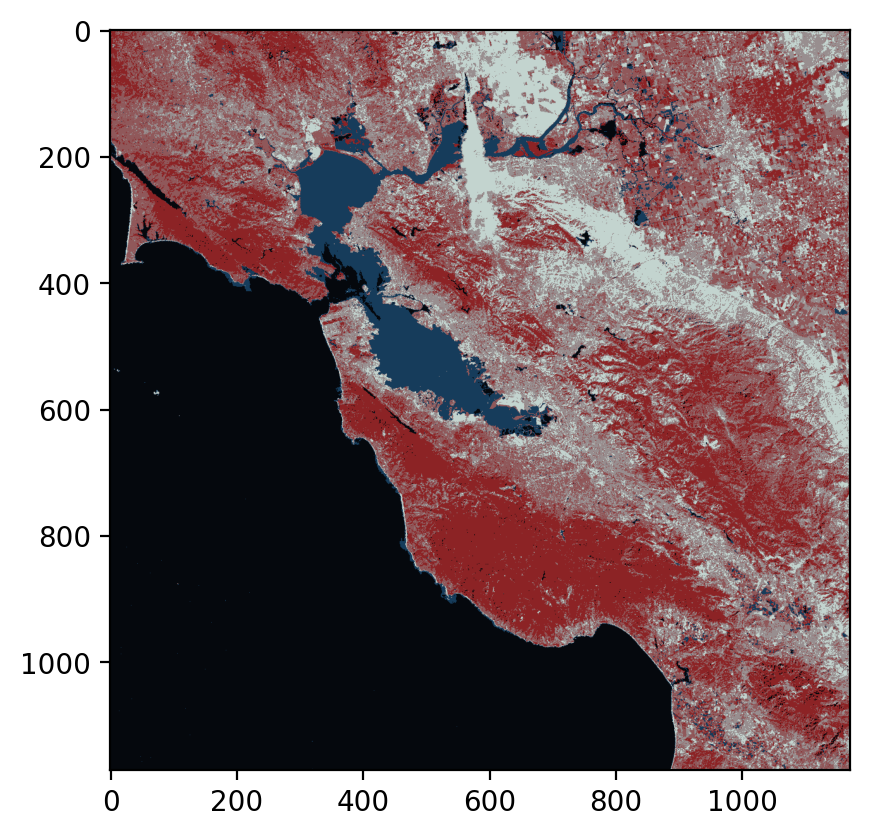

In [187]:
rgbFromIndexed = imageIndexed.convert("RGB")
plt.imshow(rgbFromIndexed)
plt.show()

If you use N=6, you should have one color representing ocean, and two red colors (one bright, one dull)
for vegetated regions, with the other colors representing urban or arid land.

(5) Now using the quantized image, we can get both the pixel count and RGB color for each of these
six colors by calling

In [188]:
color_counts = rgbFromIndexed.getcolors()
counts = []
palette = []
for count, rgb in color_counts:
    counts.append(count)
    palette.append(rgb)

Store this color information into two lists: counts and palette, and use the following provided
function to generate a bar plot showing the area covered by each color. Which color represents
healthy vegetation?

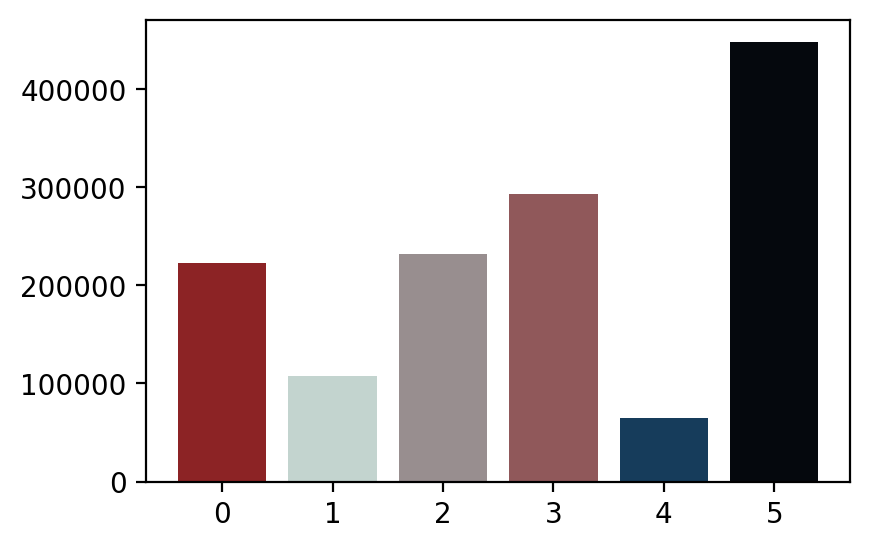

In [189]:
from image_manipulation import bar_plot_with_colors
bar_plot_with_colors(counts,palette)

Try this for a few different values of N, displaying the image and comparing the color-discretized
image to the original, false-color image.

Array info:
shape: (1170, 1170)
dtype: uint8
min, max: 0 14



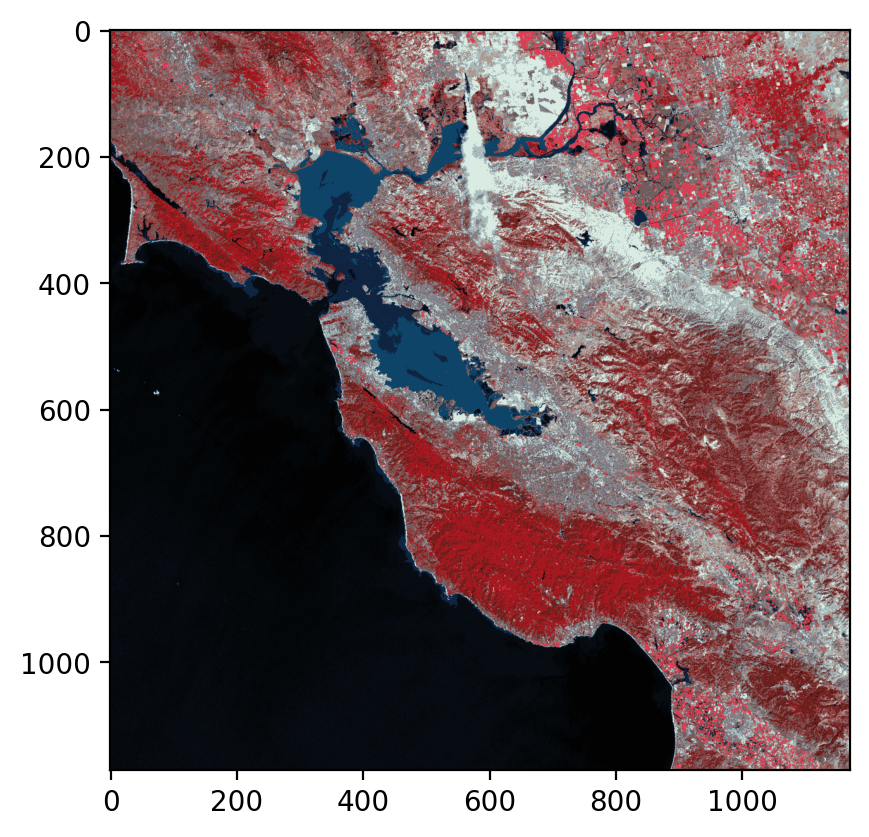

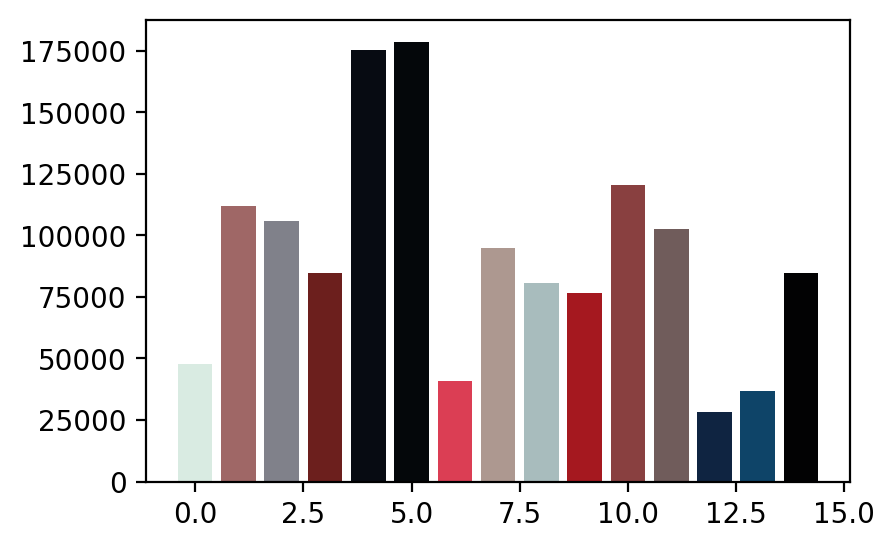

In [190]:
# Test for better N (N = 15)
imageRGB = Image.fromarray(img_as_ubyte(image_crop))
imageIndexed = imageRGB.quantize(colors=15, kmeans=1)
PrintArrayInfo(np.array(imageIndexed))
rgbFromIndexed = imageIndexed.convert("RGB")
plt.imshow(rgbFromIndexed)
plt.show()
color_counts = rgbFromIndexed.getcolors()
counts = []
palette = []
for count, rgb in color_counts:
    counts.append(count)
    palette.append(rgb)

bar_plot_with_colors(counts,palette)

Part 5 (Optional) – Other LANDSAT band combinations

For those interested here is a list of common combination of bands for various uses to explore:
bands = [4,3,2] # Natural Color

bands = [7,6,4] # False Color (Urban)

bands = [5,4,3] # Color infrared (Vegetation)

bands = [6,5,2] # Agriculture

bands = [7,6,5] # Atmospheric Penetration

bands = [5,6,2] # Healthy Vegetation

bands = [5,6,2] # Land/Water

bands = [7,5,3] # Natural with Atmospheric Removal

bands = [7,5,4] # Shortwave Infrared

bands = [6,5,4] # Vegetation Analysis